In [ ]:
###Identify genes with cell type specific expression in a cell type of interest
###Uses data from the Tabula muris - a multi tissue atlas 
###This example identifies high and specifically expressed genes in type B pancreatic cells

In [1]:
import scanpy
import pandas as pd
import numpy as np
import igraph
import sys
import pooch
import matplotlib as plt
import anndata as ad
import leidenalg
import seaborn as sns

In [2]:
print(sys.version)
scanpy.logging.print_versions()

3.11.11 | packaged by Anaconda, Inc. | (main, Dec 11 2024, 16:34:19) [MSC v.1929 64 bit (AMD64)]
-----
anndata     0.11.1
scanpy      1.10.4
-----
PIL                         11.0.0
anyio                       NA
asttokens                   NA
attr                        24.2.0
attrs                       24.2.0
babel                       2.11.0
backports                   NA
brotli                      1.0.9
certifi                     2024.08.30
charset_normalizer          3.3.2
colorama                    0.4.6
comm                        0.2.1
cycler                      0.12.1
cython_runtime              NA
dateutil                    2.9.0.post0
debugpy                     1.6.7
decorator                   5.1.1
defusedxml                  0.7.1
executing                   0.8.3
fastjsonschema              NA
h5py                        3.12.1
idna                        3.7
igraph                      0.11.8
ipykernel                   6.29.5
jaraco                      NA
jedi

In [3]:
#Read Tabula muris file
file = "C:/Users/Nilima/Downloads/Tabula_muris.h5ad"
tm = scanpy.read_h5ad(file, backed=None)

<Axes: title={'center': 'donor_id'}, xlabel='UMAP1', ylabel='UMAP2'>

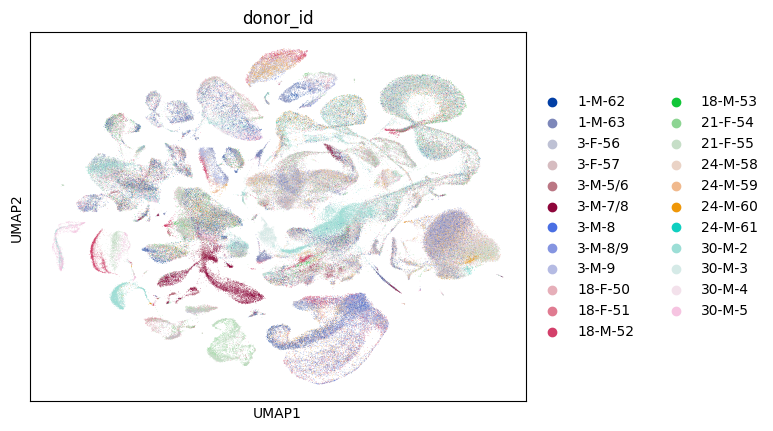

In [4]:
#Visualize umaps for tabula muris data
scanpy.pl.umap(tm, color=['donor_id'], show = False)

<Axes: title={'center': 'tissue'}, xlabel='UMAP1', ylabel='UMAP2'>

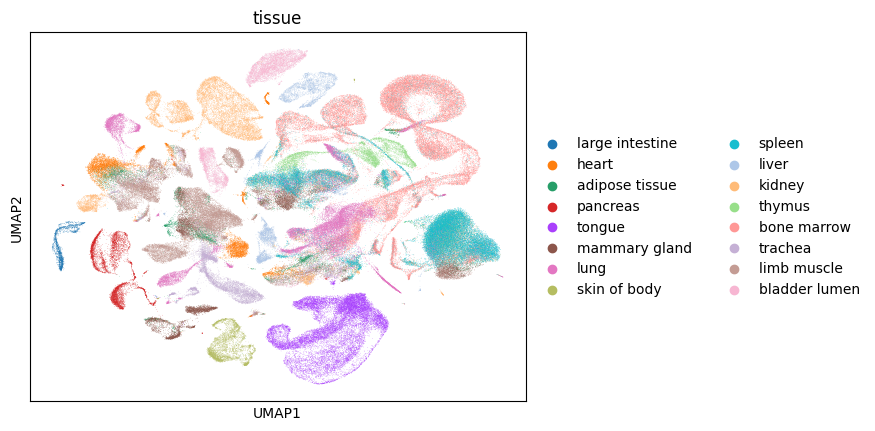

In [5]:
scanpy.pl.umap(tm, color=['tissue'], show = False)

<Axes: title={'center': 'cell_type'}, xlabel='UMAP1', ylabel='UMAP2'>

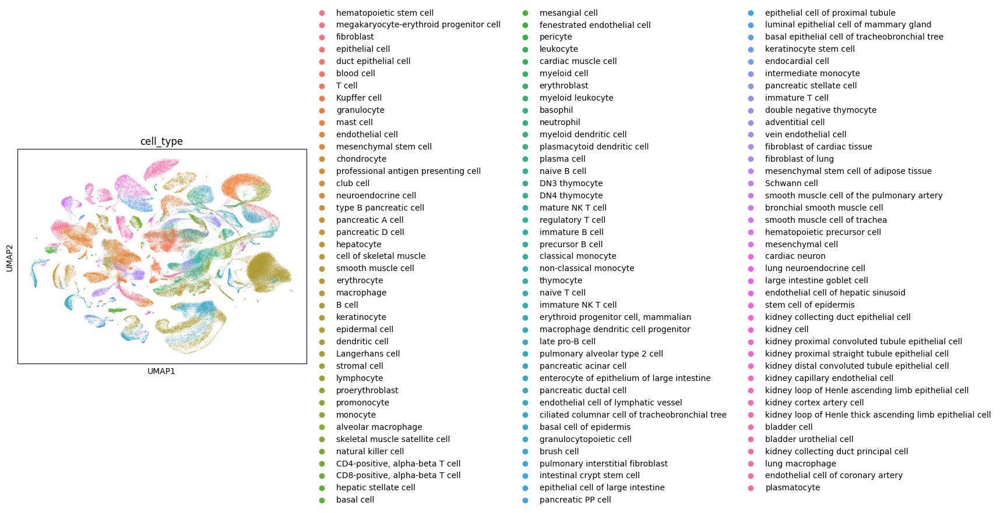

In [6]:
#Adding a color palette because cell_type_color in uns in just one color
scanpy.pl.umap(tm, color=['cell_type'], show = False, palette=sns.color_palette("husl", 122))

<Axes: title={'center': 'age'}, xlabel='UMAP1', ylabel='UMAP2'>

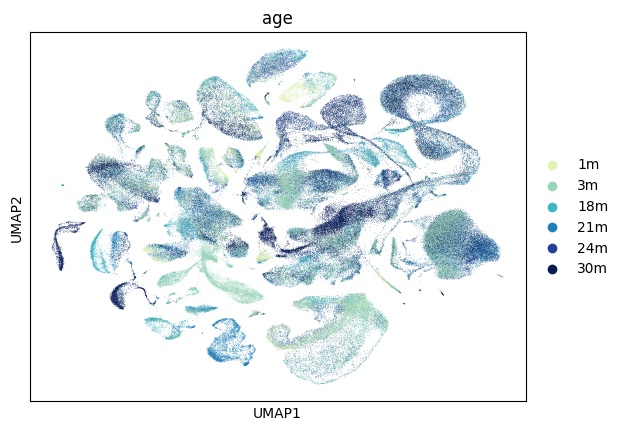

In [7]:
scanpy.pl.umap(tm, color=['age'], show = False)

<Axes: title={'center': 'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>

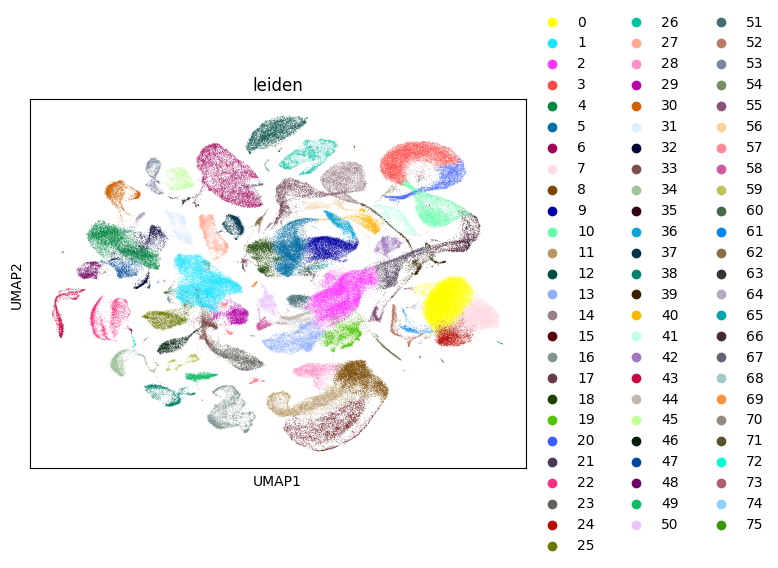

In [8]:
scanpy.pl.umap(tm, color=['leiden'], show = False)

In [9]:
##Subset out data from only old mice i.e age 18m and above
tm_age = tm[tm.obs['age'].isin(['18m','21m','24m','30m'])] #173807
tm_age

View of AnnData object with n_obs × n_vars = 173807 × 17984
    obs: 'age', 'cell', 'free_annotation', 'method', 'donor_id', 'n_genes', 'subtissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'age_colors', 'citation', 'leiden', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'schema_reference', 'schema_version', 'title', 'donor_id_colors', 'tissue

In [10]:
#Check what data in X looks like
print(tm_age.X)
#Data looks lognormalized

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 318314973 stored elements and shape (173807, 17984)>
  Coords	Values
  (0, 0)	2.510500192642212
  (0, 3)	2.1507961750030518
  (0, 7)	2.32142972946167
  (0, 61)	3.3847835063934326
  (0, 62)	2.9239156246185303
  (0, 64)	9.102213859558105
  (0, 78)	4.178806304931641
  (0, 94)	2.3215222358703613
  (0, 122)	4.577788829803467
  (0, 123)	2.8975045680999756
  (0, 136)	6.1979780197143555
  (0, 170)	6.624351978302002
  (0, 171)	2.3061585426330566
  (0, 174)	3.457357883453369
  (0, 192)	6.093574047088623
  (0, 196)	4.185334205627441
  (0, 197)	2.5703203678131104
  (0, 202)	2.872211217880249
  (0, 207)	2.9703168869018555
  (0, 210)	2.825045585632324
  (0, 212)	5.69992208480835
  (0, 218)	3.5929737091064453
  (0, 223)	2.658627510070801
  (0, 235)	6.694092273712158
  (0, 259)	2.047475576400757
  :	:
  (173806, 17843)	1.8416699171066284
  (173806, 17866)	3.0298855304718018
  (173806, 17874)	1.3424092531204224
  (173806, 17877)	2.0523200035

In [11]:
tm_age.layers["counts"]= tm_age.X.copy()
tm_age.to_df(layer= 'counts')

C:\Users\Nilima\AppData\Local\Temp\ipykernel_26324\1069023437.py:1: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  tm_age.layers["counts"]= tm_age.X.copy()


,ENSMUSG00000029422,ENSMUSG00000049036,ENSMUSG00000029577,ENSMUSG00000040746,ENSMUSG00000020590,ENSMUSG00000030263,ENSMUSG00000038914,ENSMUSG00000026878,ENSMUSG00000038984,ENSMUSG00000030098,...,ENSMUSG00000092086,ENSMUSG00000036257,ENSMUSG00000057236,ENSMUSG00000044083,ENSMUSG00000035875,ENSMUSG00000020070,ENSMUSG00000030178,ENSMUSG00000021033,ENSMUSG00000030657,ENSMUSG00000040693
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGCAGGGTACA-1-0-0-0,2.510500,0.0,0.000000,2.150796,0.00000,0.000000,0.000000,2.321430,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,9.149252,0.0
AAACCTGCAGTAAGCG-1-0-0-0,1.411730,0.0,0.000000,0.780522,0.00000,0.000000,0.000000,1.995112,0.0,0.0,...,0.0,0.886421,1.092871,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
AAACCTGTCATTATCC-1-0-0-0,1.060576,0.0,0.000000,0.000000,0.00000,0.000000,1.858372,2.323704,0.0,0.0,...,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
AAACGGGGTACAGTGG-1-0-0-0,0.644871,0.0,0.000000,1.857837,0.00000,0.000000,0.000000,0.000000,0.0,0.0,...,0.0,0.928572,0.663815,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
AAACGGGGTCTTCTCG-1-0-0-0,1.527815,0.0,0.000000,1.937129,0.00000,0.000000,0.000000,0.865817,0.0,0.0,...,0.0,0.000000,2.018775,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAAGCGTAG-1-40-1-0,0.659375,0.0,0.000000,0.836027,0.00000,0.000000,0.000000,1.886559,0.0,0.0,...,0.0,0.000000,0.678745,0.0,0.0,0.000000,0.0,4.109947,0.000000,0.0
TTTGGTTCAATGGACG-1-40-1-0,0.000000,0.0,0.000000,0.000000,2.60133,0.000000,0.000000,2.248132,0.0,0.0,...,0.0,2.994735,1.041076,0.0,0.0,0.000000,0.0,4.562962,0.000000,0.0
TTTGGTTGTGCTAGCC-1-40-1-0,1.197928,0.0,0.000000,0.895619,0.00000,0.000000,0.000000,1.456655,0.0,0.0,...,0.0,2.709450,0.000000,0.0,0.0,0.000000,0.0,4.290936,0.000000,0.0


In [12]:
#Data already normalized+logarithmized - Run this cell only if data is raw
#Normalizing to median total counts
#scanpy.pp.normalize_total(tm_age)
#Logarithmize the data
#scanpy.pp.log1p(tm_age)
#print('done')

In [13]:
#Get only highly variable genes
#scanpy.pp.highly_variable_genes(tm_age,flavor='seurat',batch_key = "tissue")
#scanpy.pl.highly_variable_genes(tm_age)
#tm_age_1 = tm_age[:, tm_age.var["highly_variable"]]
#tm_age_1.shape
#Skipping this step. Clustering looks worse across tissues for this dataset with only highly variable genes

In [14]:
scanpy.pp.pca(tm_age)

In [15]:
#Calculate nearest neighbour distance matrix
scanpy.pp.neighbors(tm_age)
tm_age

C:\Users\Nilima\anaconda3\envs\scRNA-seq\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


AnnData object with n_obs × n_vars = 173807 × 17984
    obs: 'age', 'cell', 'free_annotation', 'method', 'donor_id', 'n_genes', 'subtissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'assay_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'sex_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'age_colors', 'citation', 'leiden', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'schema_reference', 'schema_version', 'title', 'donor_id_colors', 'tissue_colors'

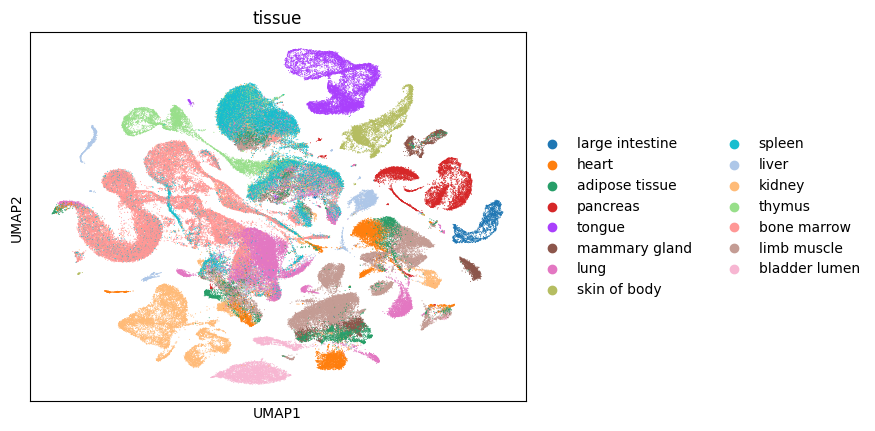

In [16]:
#UMAP
scanpy.tl.umap(tm_age)
scanpy.pl.umap(tm_age,color='tissue',size=2)

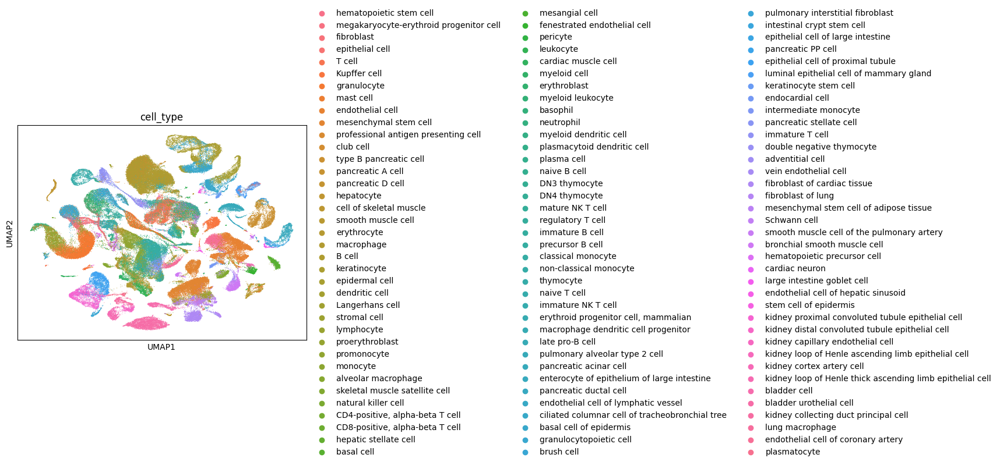

In [17]:
scanpy.pl.umap(tm_age,color='cell_type',size=2)

In [18]:
#Leiden clustering
scanpy.tl.leiden(tm_age, n_iterations=10, key_added = "leiden_res0_25", resolution=0.25)
scanpy.tl.leiden(tm_age, n_iterations=10, key_added = "leiden_res0_5", resolution=0.5)
scanpy.tl.leiden(tm_age, n_iterations=10, key_added = "leiden_res1", resolution=1.0)
#Did not use flavor ="igraph" as there is a current windows specific bug. Change in future iterations

C:\Users\Nilima\AppData\Local\Temp\ipykernel_26324\947233372.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  scanpy.tl.leiden(tm_age, n_iterations=10, key_added = "leiden_res0_25", resolution=0.25)


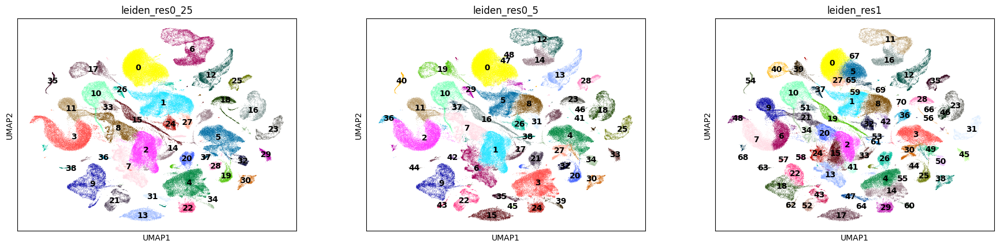

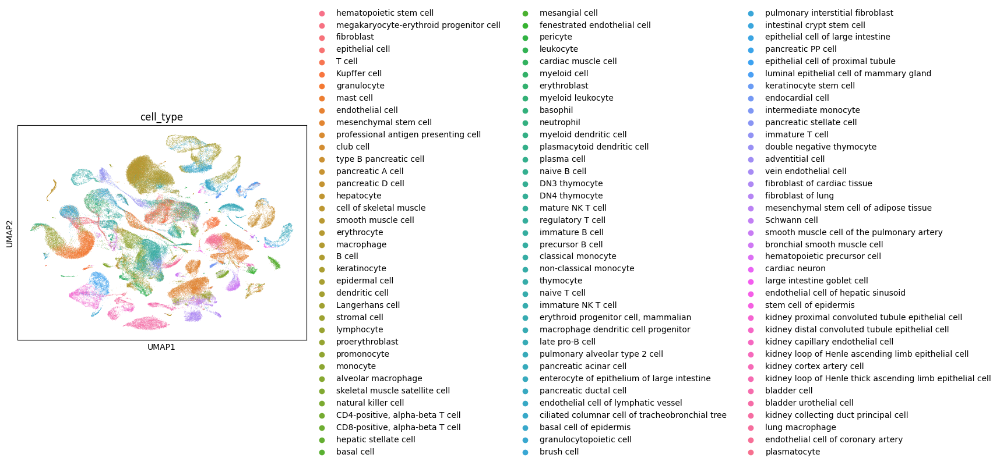

In [19]:
#Visualize Leiden clustering
scanpy.pl.umap(tm_age,color=["leiden_res0_25","leiden_res0_5","leiden_res1"], legend_loc="on data")
scanpy.pl.umap(tm_age,color=["cell_type"])
#res1 matches cell_type most closely

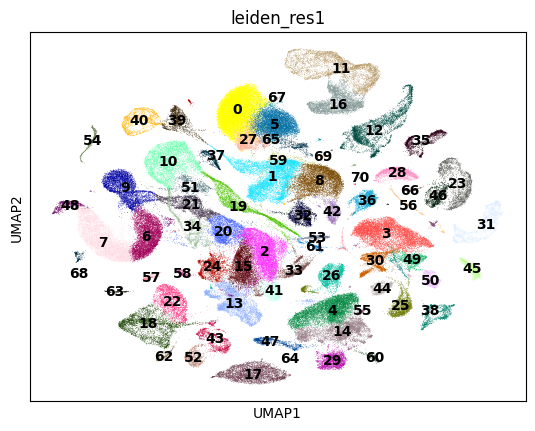

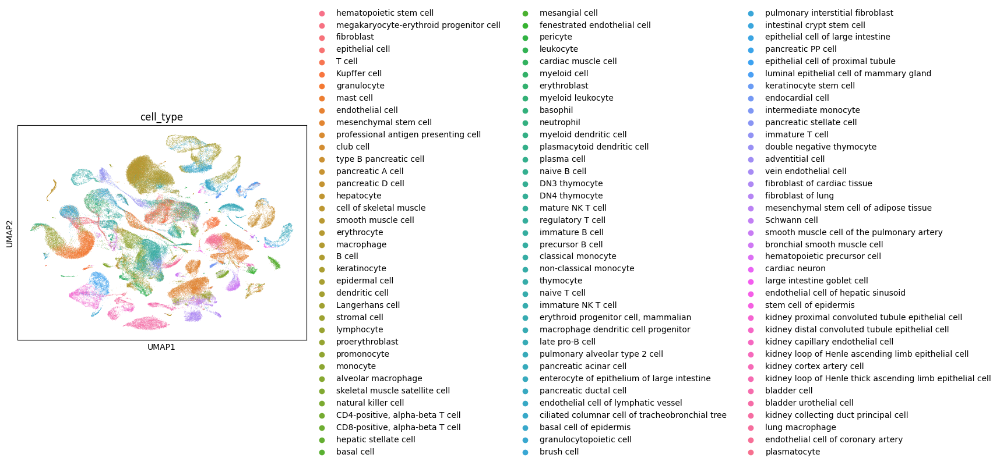

In [20]:
#Pick leiden res1 as it matches most closely with cell type
scanpy.pl.umap(tm_age,color=["leiden_res1"], legend_loc="on data")
scanpy.pl.umap(tm_age,color=["cell_type"])

C:\Users\Nilima\anaconda3\envs\scRNA-seq\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:429: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
C:\Users\Nilima\anaconda3\envs\scRNA-seq\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:431: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
C:\Users\Nilima\anaconda3\envs\scRNA-seq\Lib\site-packages\scanpy\tools\_rank_genes_groups.py:434: PerformanceWarning: Da

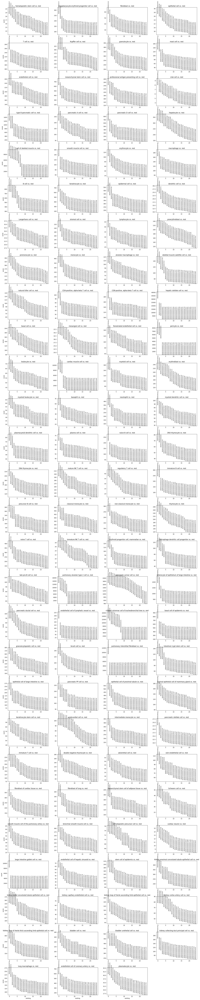

In [21]:
##Find markers - grouping by cell type annotation. Grouping can also be by leiden clustering 
scanpy.tl.rank_genes_groups(tm_age, groupby = "cell_type", method ='t-test', use_raw=False)
scanpy.pl.rank_genes_groups(tm_age, n_genes =25, sharey = False)

In [22]:
#Extract differential expression genes for the cell type of interest
#In this example it is the type B pancreatic cell
mdf = scanpy.get.rank_genes_groups_df(tm_age, group = "type B pancreatic cell")
mdf

,names,scores,logfoldchanges,pvals,pvals_adj
0,ENSMUSG00000000215,1239.574463,16.262800,0.0,0.0
1,ENSMUSG00000035804,824.856750,16.893425,0.0,0.0
2,ENSMUSG00000041681,824.532349,16.914841,0.0,0.0
3,ENSMUSG00000027419,419.103363,16.480017,0.0,0.0
4,ENSMUSG00000021194,391.475525,16.594629,0.0,0.0
...,...,...,...,...,...
17979,ENSMUSG00000026728,-392.494598,-8.722573,0.0,0.0
17980,ENSMUSG00000032231,-401.135620,-8.877570,0.0,0.0
17981,ENSMUSG00000030220,-407.801300,-8.635771,0.0,0.0
17982,ENSMUSG00000006519,-470.721527,-8.405920,0.0,0.0


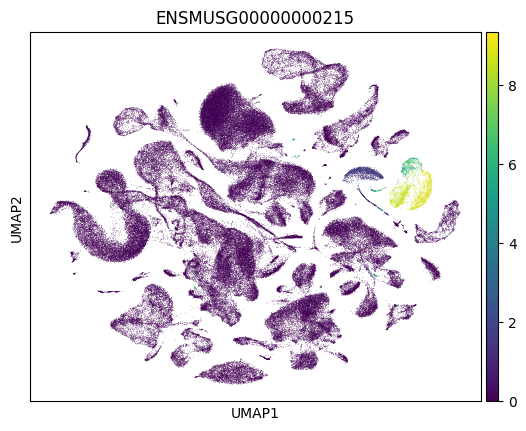

<Axes: title={'center': 'cell_type'}, xlabel='UMAP1', ylabel='UMAP2'>

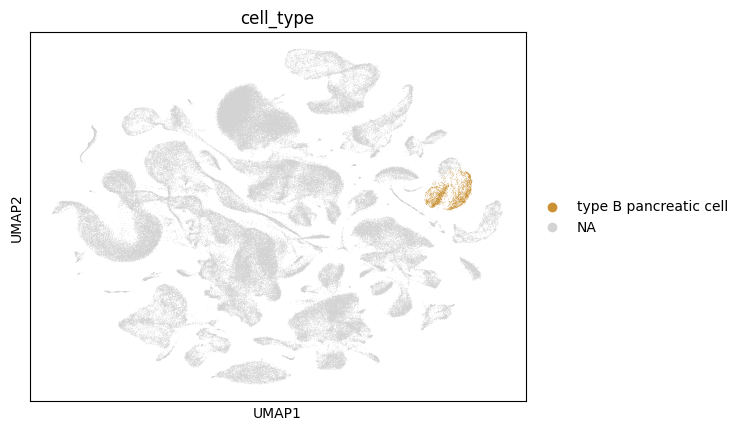

In [23]:
#Visualize gene expression of top marker for type B pancreatic cell
scanpy.pl.umap(tm_age, use_raw = False, color = ['ENSMUSG00000000215']) #INS2
#Color by cell type of interest
scanpy.pl.umap(tm_age, color=["cell_type"], groups=["type B pancreatic cell"], show=False)

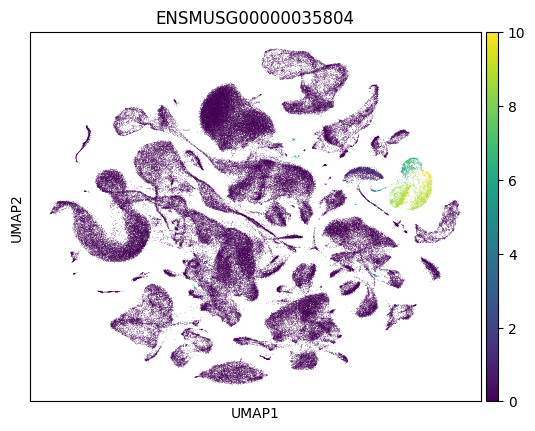

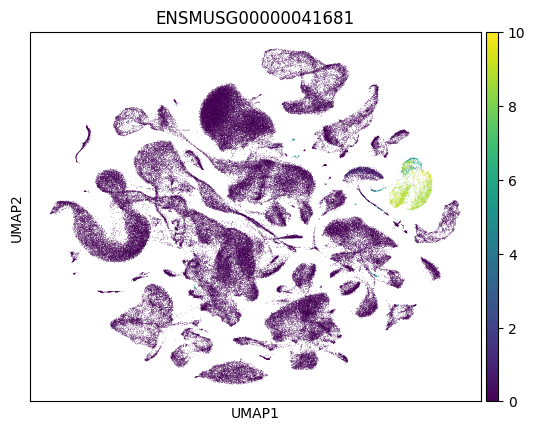

In [24]:
#Visualize gene expression of 2nd and 3rd marker for type B pancreatic cell
scanpy.pl.umap(tm_age, use_raw = False, color = ['ENSMUSG00000035804']) #INS1
scanpy.pl.umap(tm_age, use_raw = False, color = ['ENSMUSG00000041681']) #IAPP